<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [1]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torch.cuda import is_available
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [2]:
destination_path = '../input/faces-dataset'

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [3]:
def get_dataloader(image_size, batch_size):
  """
  Builds dataloader for training data.
  Use tt.Compose and tt.Resize for transformations
  :param image_size: height and wdith of the image
  :param batch_size: batch_size of the dataloader
  :returns: DataLoader object 
  """
  transform = tt.Compose([tt.Resize(image_size),
                          tt.ToTensor(),
                          tt.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
  dataset = ImageFolder(destination_path, transform)
  dataloader = DataLoader(dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
  return dataloader

In [4]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [5]:
image_size = 64
batch_size = 64

dataloader = get_dataloader(image_size, batch_size)

In [6]:
# Перенесем все на gpu
for images, _ in dataloader:
    images = images.to(device)
    print(f"Batch of images shape: {images.shape}")
    break

Batch of images shape: torch.Size([64, 3, 64, 64])


Посмотрим на красавчиков!

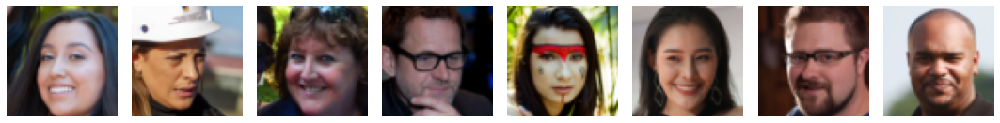

In [7]:
# Возьмем один батч из DataLoader
data_iter = iter(dataloader)
images, _ = next(data_iter)

# Денормализуем изображения из [-1, 1] в [0, 1] для корректного отображения
images = images * 0.5 + 0.5

# Установим количество изображений для отображения
num_images = min(8, images.shape[0])

# Создаем фигуру для отображения изображений
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

for i in range(num_images):
    img = images[i].permute(1, 2, 0).cpu().numpy()  # Перестановка размерностей для matplotlib
    axes[i].imshow(img)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [8]:
discriminator = nn.Sequential(
    nn.Conv2d(3, image_size, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(image_size, image_size*2, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*2),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(image_size*2, image_size*4, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*4),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(image_size*4, image_size*8, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*8),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(image_size*8, 1, kernel_size=4, stride=2, padding=0, bias=False),

    nn.Flatten(),
    nn.Sigmoid())

In [9]:
latent_size = 256

In [10]:
generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size, image_size*16, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(image_size*16),
    nn.LeakyReLU(0.2, inplace=True),
    
    nn.ConvTranspose2d(image_size*16, image_size*8, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*8),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*8, image_size*4, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*4),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*4, image_size*2, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*2),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*2, image_size, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
).to(device)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [11]:
# инициализация весов
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [12]:
lr = 0.0005

discriminator.apply(weights_init)
generator.apply(weights_init)

model = {
    "discriminator": discriminator,
    "generator": generator
}


optimizer = {
    "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                      lr=lr, betas=(0.5, 0.999)),
    "generator": torch.optim.Adam(model["generator"].parameters(),
                                  lr=lr, betas=(0.5, 0.999))
}


criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [13]:
def fit(model, criterion, epochs, lr, start_idx=1):
    model["discriminator"].to(device)
    model["generator"].to(device)
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    for epoch in range(epochs):

        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(dataloader):
            # Обучение дискриминатора
            real_images = real_images.to(device)
            optimizer["discriminator"].zero_grad()

            # Передаем реальные изображения дискриминатору
            real_preds = model["discriminator"](real_images)
            real_targets = torch.FloatTensor(real_images.size(0), 1).uniform_(0.95, 1.0).to(device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Генерируем изображений
            latent = torch.randn(real_images.size(0), latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Передаем сгенерированные изображения дискриминатору
            fake_targets = torch.FloatTensor(real_images.size(0), 1).uniform_(0.0, 0.05).to(device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Обновляем веса
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Обучаем генератор
            optimizer["generator"].zero_grad()
            
            # Генерируем изображения
            latent = torch.randn(real_images.size(0), latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Передаем сгенерированные изображения дискриминатору
            preds = model["discriminator"](fake_images)
            targets = torch.FloatTensor(real_images.size(0), 1).uniform_(0.95, 1.0).to(device)
            loss_g = criterion["generator"](preds, targets)
            
            # Обновляем веса
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Запись в историю
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        # Логирование
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        # Пример генерации
        plt.figure(figsize=(12,12))
        plt.axis("off")
        plt.title("Generated Images")
        plt.imshow(np.transpose(make_grid(fake_images.to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))
        plt.show()
    
    return losses_g, losses_d, real_scores, fake_scores

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [1/30], loss_g: 2.6381, loss_d: 96.9518, real_score: 0.9722, fake_score: 0.9969


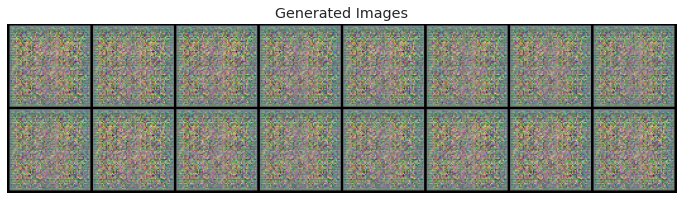

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [2/30], loss_g: 3.8258, loss_d: 15.7698, real_score: 0.7715, fake_score: 0.3759


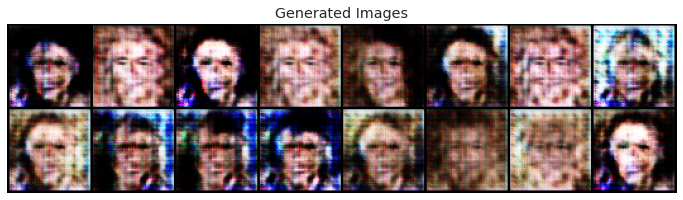

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [3/30], loss_g: 3.2934, loss_d: 0.9252, real_score: 0.7269, fake_score: 0.2713


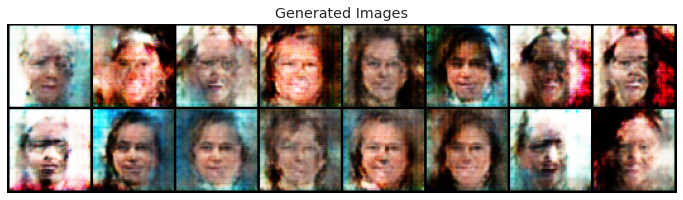

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [4/30], loss_g: 3.0407, loss_d: 0.8849, real_score: 0.7350, fake_score: 0.2628


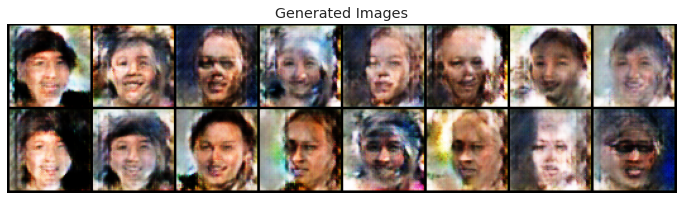

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [5/30], loss_g: 3.0821, loss_d: 0.8150, real_score: 0.7581, fake_score: 0.2405


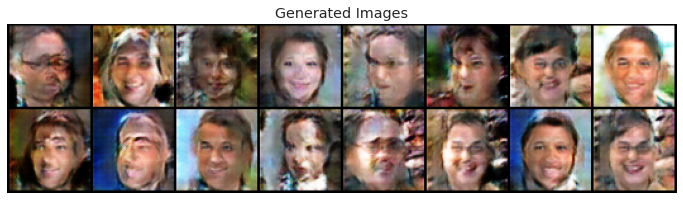

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [6/30], loss_g: 3.0974, loss_d: 0.7631, real_score: 0.7755, fake_score: 0.2236


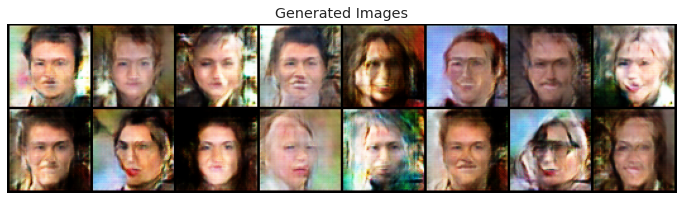

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [7/30], loss_g: 3.1184, loss_d: 0.7274, real_score: 0.7902, fake_score: 0.2084


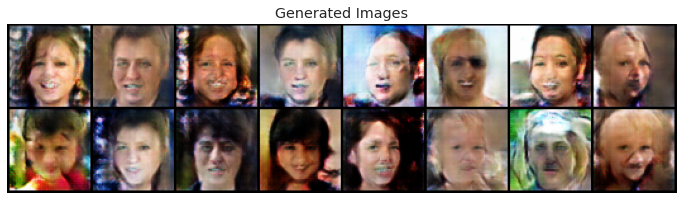

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [8/30], loss_g: 3.0668, loss_d: 0.6981, real_score: 0.7988, fake_score: 0.2008


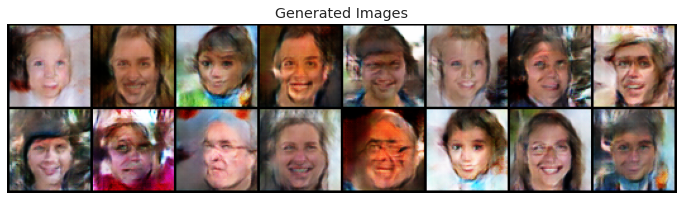

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [9/30], loss_g: 3.1228, loss_d: 0.6672, real_score: 0.8106, fake_score: 0.1886


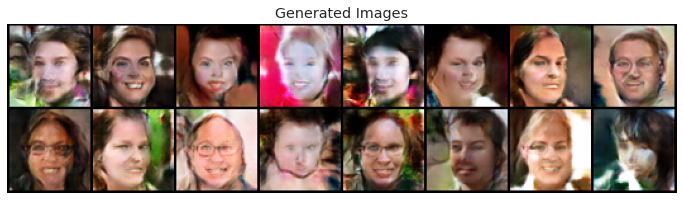

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [10/30], loss_g: 3.2640, loss_d: 0.6408, real_score: 0.8237, fake_score: 0.1760


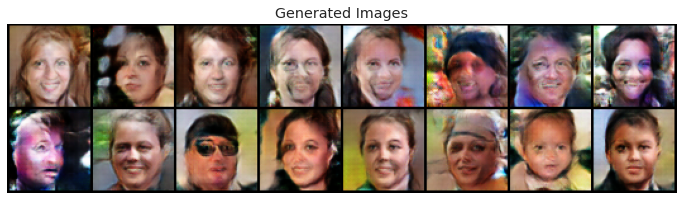

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [11/30], loss_g: 3.2378, loss_d: 0.6156, real_score: 0.8328, fake_score: 0.1665


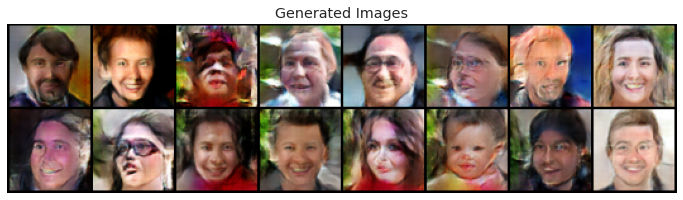

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [12/30], loss_g: 3.3778, loss_d: 0.5935, real_score: 0.8397, fake_score: 0.1596


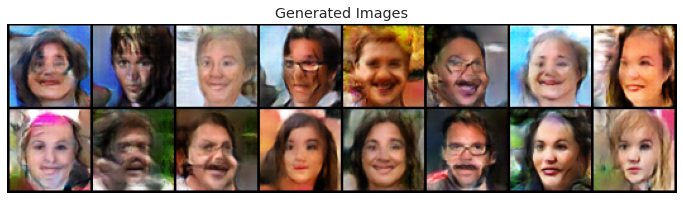

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [13/30], loss_g: 3.4433, loss_d: 0.5795, real_score: 0.8491, fake_score: 0.1507


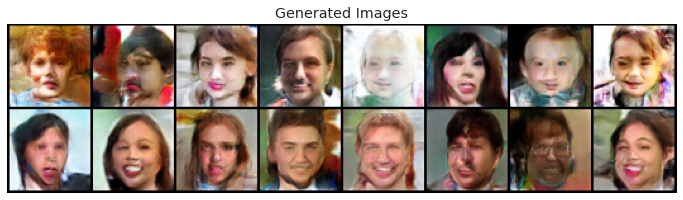

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [14/30], loss_g: 3.4283, loss_d: 0.5842, real_score: 0.8477, fake_score: 0.1515


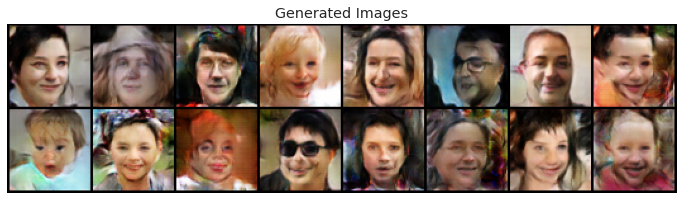

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [15/30], loss_g: 3.4011, loss_d: 0.5753, real_score: 0.8507, fake_score: 0.1489


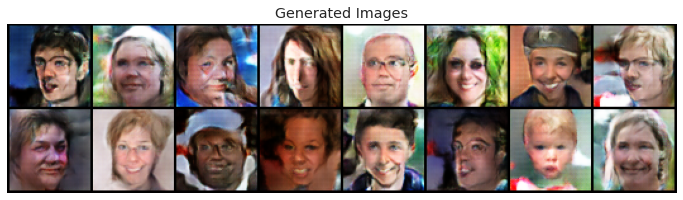

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [16/30], loss_g: 3.3978, loss_d: 0.5594, real_score: 0.8554, fake_score: 0.1442


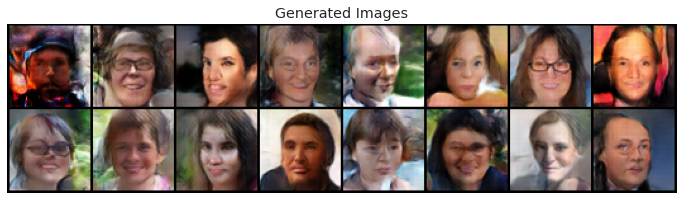

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [17/30], loss_g: 3.4583, loss_d: 0.5574, real_score: 0.8566, fake_score: 0.1430


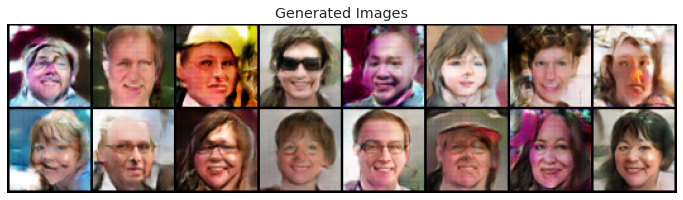

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [18/30], loss_g: 3.4926, loss_d: 0.5541, real_score: 0.8603, fake_score: 0.1392


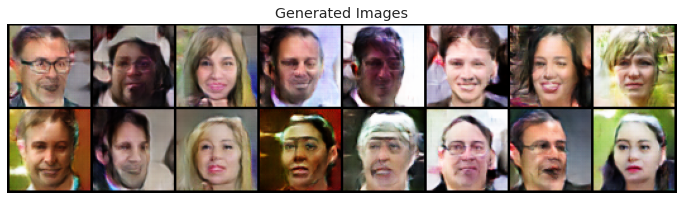

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [19/30], loss_g: 3.4855, loss_d: 0.5283, real_score: 0.8663, fake_score: 0.1334


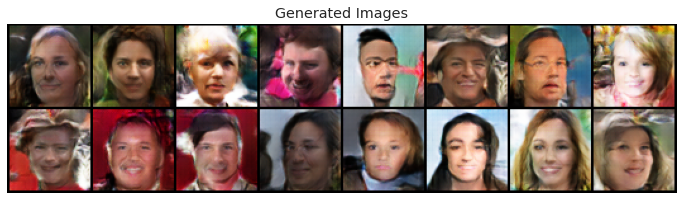

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [20/30], loss_g: 3.6534, loss_d: 0.5236, real_score: 0.8710, fake_score: 0.1284


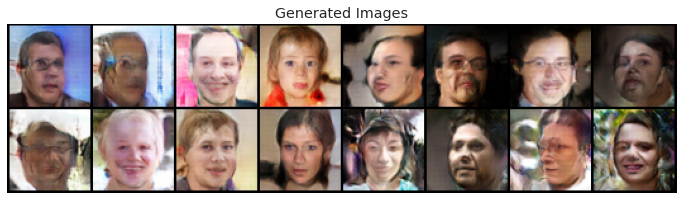

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [21/30], loss_g: 3.5488, loss_d: 0.5298, real_score: 0.8696, fake_score: 0.1299


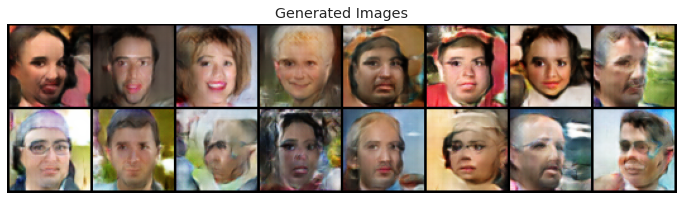

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [22/30], loss_g: 3.5774, loss_d: 0.5216, real_score: 0.8729, fake_score: 0.1269


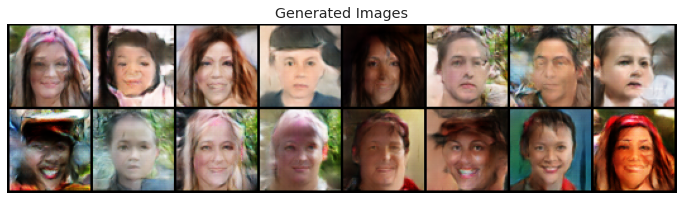

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [23/30], loss_g: 3.5825, loss_d: 0.4934, real_score: 0.8805, fake_score: 0.1191


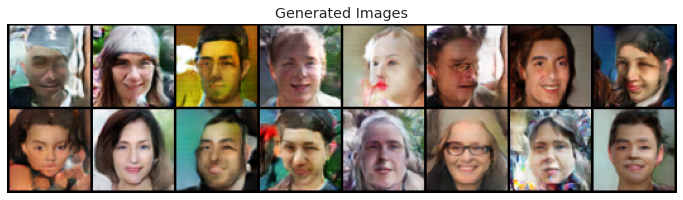

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [24/30], loss_g: 3.6541, loss_d: 0.5052, real_score: 0.8794, fake_score: 0.1205


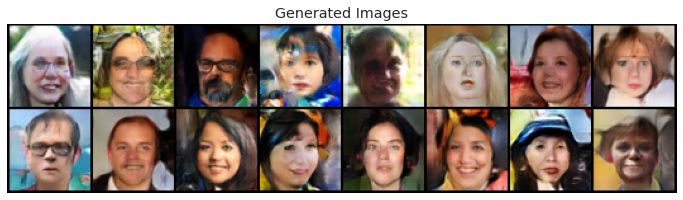

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [25/30], loss_g: 3.6886, loss_d: 0.4876, real_score: 0.8826, fake_score: 0.1170


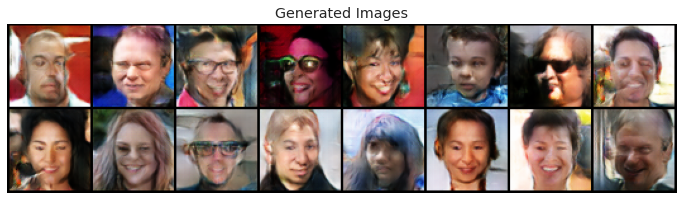

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [26/30], loss_g: 3.6905, loss_d: 0.4831, real_score: 0.8864, fake_score: 0.1134


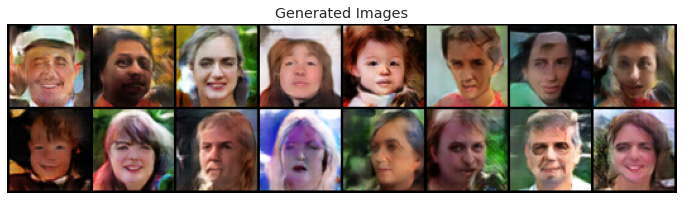

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [27/30], loss_g: 3.6259, loss_d: 0.4961, real_score: 0.8856, fake_score: 0.1141


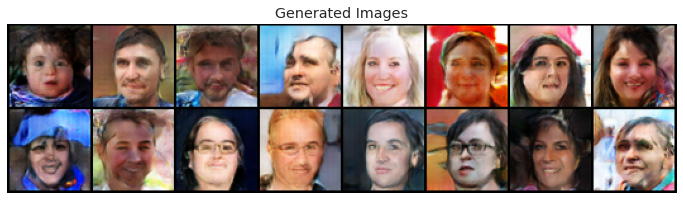

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [28/30], loss_g: 3.7097, loss_d: 0.4763, real_score: 0.8879, fake_score: 0.1117


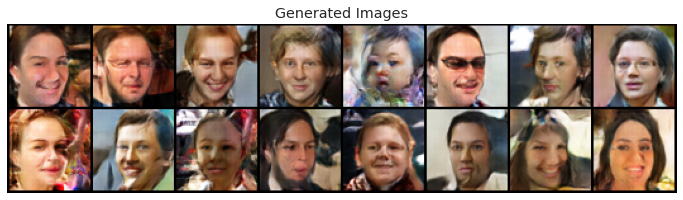

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [29/30], loss_g: 3.7460, loss_d: 0.4727, real_score: 0.8898, fake_score: 0.1103


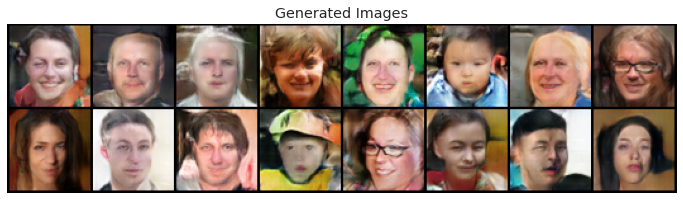

  0%|          | 0/1094 [00:00<?, ?it/s]

Epoch [30/30], loss_g: 3.7560, loss_d: 0.4671, real_score: 0.8929, fake_score: 0.1069


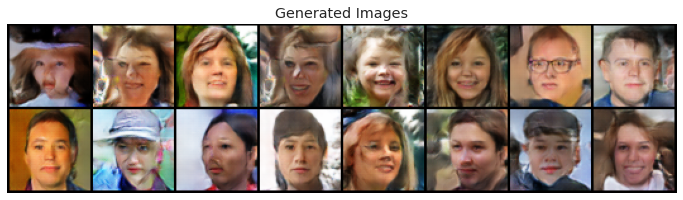

In [14]:
losses_g, losses_d, real_scores, fake_scores = fit(model, criterion, 30, lr)

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

Text(0.5, 1.0, 'Losses')

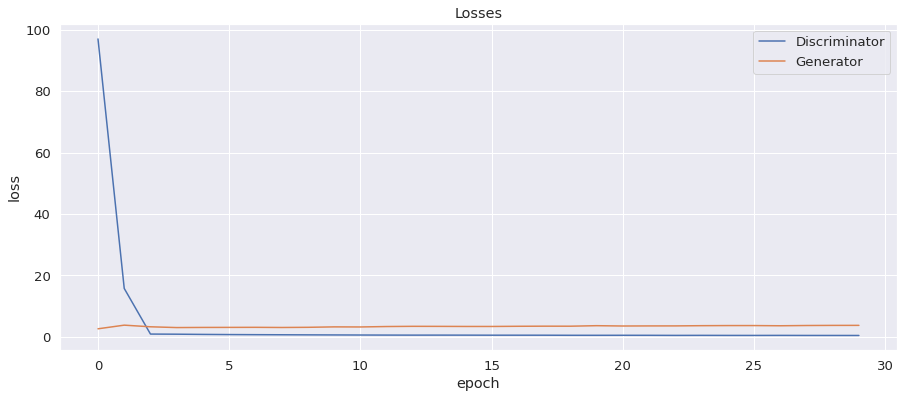

In [15]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')

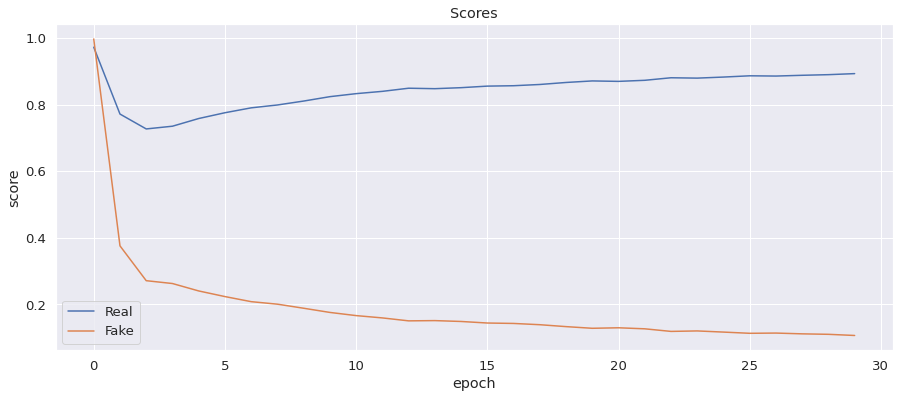

In [16]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

Хорошие графики, лоссы вышли на плато, а real и fake score's приблизились к 1 и 0 как и ожидалось.

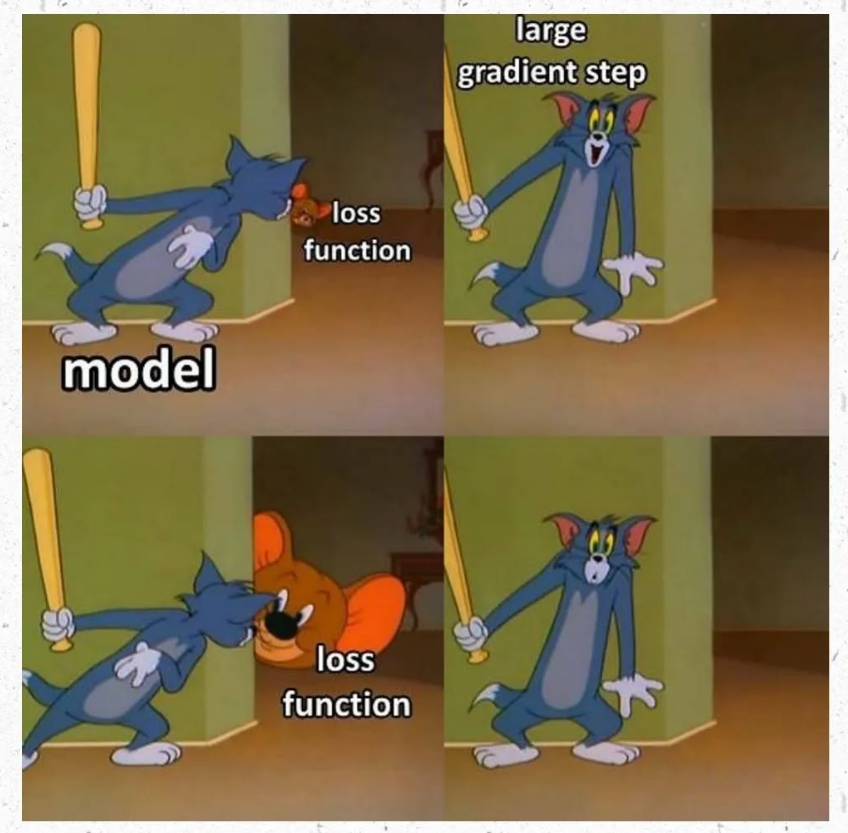

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

In [17]:
def show_images(generated):
    # Преобразуем тензоры в диапазон [0, 1] для корректного отображения
    generated = (generated + 1) / 2  # Из диапазона [-1, 1] в [0, 1]

    # Переводим в numpy для отображения
    generated = generated.cpu().detach().numpy()

    # Создаем фигуру
    n_images = generated.shape[0]
    plt.figure(figsize=(n_images * 3, 3))

    for i in range(n_images):
        plt.subplot(1, n_images, i + 1)
        img = np.transpose(generated[i], (1, 2, 0))  # Меняем порядок осей (C, H, W) -> (H, W, C)
        plt.imshow(img)
        plt.axis("off")

    plt.show()

In [18]:
n_images = 8

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)

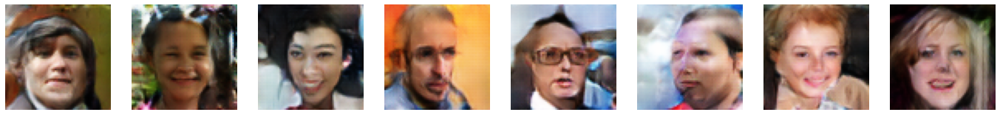

In [19]:
show_images(fake_images)

Как вам качество получившихся изображений?

Генератор выучил многообразие трейнового датасета и умеет создавать как женщин, так и мужчин, черных и белых. Однако стоит заметить, что качество оставляет желать лучшего, видны артефакты и прочие дефекты лица, увеличение размера картинки до 128 улучшений не дало, кол-во эпох обучения также было выбрано оптимальное кол-во исходя из графиков лосс функций, можно сделать предположение, что лучшего качество на данном датасете с обычным ганом не добится.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut
import numpy as np

def evaluate_generated_images(real_images, fake_images):
    """
    Оценка качества сгенерированных изображений с помощью leave-one-out.

    Параметры:
    - real_images: тензор с настоящими изображениями, размер [N, C, H, W].
    - fake_images: тензор с фейковыми изображениями, размер [N, C, H, W].

    Возвращает:
    - accuracy: точность классификатора 1NN.
    """
    # Преобразуем изображения в одномерные вектора
    real_images = real_images.view(real_images.size(0), -1).cpu().detach().numpy()
    fake_images = fake_images.view(fake_images.size(0), -1).cpu().detach().numpy()

    # Создаем данные и метки
    X = np.concatenate([real_images, fake_images], axis=0)
    y = np.concatenate([np.ones(real_images.shape[0]), np.zeros(fake_images.shape[0])])

    # Инициализируем 1-NN классификатор
    knn = KNeighborsClassifier(n_neighbors=1)

# Инициализируем Leave-One-Out разбиение
    loo = LeaveOneOut()

    # Счетчик правильных предсказаний
    correct = 0

    # Проходим по каждому разбиению Leave-One-Out
    for train_index, test_index in loo.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Обучаем классификатор
        knn.fit(X_train, y_train)

        # Проверяем качество на тестовом объекте
        y_pred = knn.predict(X_test)
        if y_pred == y_test:
            correct += 1

    # Рассчитываем точность
    accuracy = correct / len(X)
    return accuracy

In [38]:
# Соберем 1000 реальных изображений из нескольких батчей
real_images = []
for real_batch, _ in dataloader:
    real_images.append(real_batch)
    if len(real_images) * real_batch.size(0) >= 1000:
        break
real_images = torch.cat(real_images, dim=0)[:1000].to(device)

# Генерируем 1000 фейковых изображений
latent = torch.randn(1000, latent_size, 1, 1, device=device)
fake_images = model["generator"](latent)

print(f"Размер реальных изображений: {real_images.shape}")
print(f"Размер фейковых изображений: {fake_images.shape}")

Размер реальных изображений: torch.Size([1000, 3, 64, 64])
Размер фейковых изображений: torch.Size([1000, 3, 64, 64])


In [39]:
# Оценка качества
accuracy = evaluate_generated_images(real_images, fake_images)
print(f"Leave-One-Out Accuracy: {accuracy:.4f}")

Leave-One-Out Accuracy: 0.7030


Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

**Высокая точность (accuracy → 1.0):** Классификатор легко отличает настоящие и фейковые изображения. Это значит, что генератор пока плохо справляется с задачей.


**Точность около 0.5:** Классификатор не может различить настоящие и фейковые изображения. Это говорит о том, что генератор создает качественные изображения, похожие на настоящие.

у нас же получилось so so

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [40]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

def visualize_distributions(real_images, fake_images):
    # Преобразование изображений в векторы
    real_images = real_images.view(real_images.size(0), -1).cpu().detach().numpy()  # (batch_size, C * H * W)
    fake_images = fake_images.view(fake_images.size(0), -1).cpu().detach().numpy()
    
    # Создание набора данных
    all_images = np.concatenate([real_images, fake_images], axis=0)
    labels = np.concatenate([
        np.ones(real_images.shape[0]),  # Метка 1 для реальных
        np.zeros(fake_images.shape[0]) # Метка 0 для фейковых
    ])

    # Применение t-SNE
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    reduced_data = tsne.fit_transform(all_images)

    # Визуализация
    plt.figure(figsize=(10, 7))
    plt.scatter(
        reduced_data[labels == 1, 0], reduced_data[labels == 1, 1],
        label="Real Images", alpha=0.7, c='blue', s=10
    )
    plt.scatter(
        reduced_data[labels == 0, 0], reduced_data[labels == 0, 1],
        label="Fake Images", alpha=0.7, c='red', s=10
    )
    plt.legend()
    plt.title("t-SNE visualization of Real vs Fake Images")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.show()

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


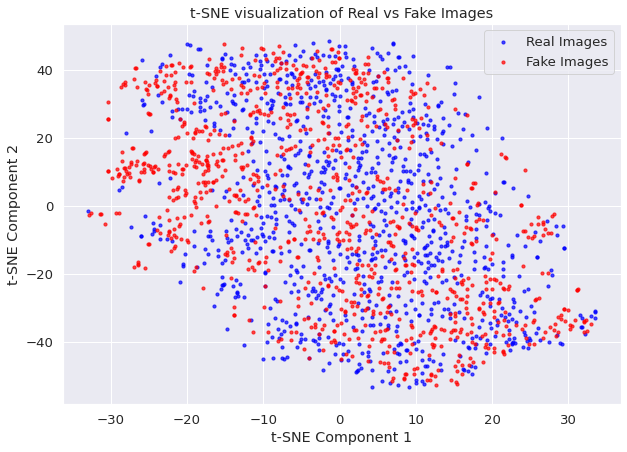

In [42]:
# Визуализация распределений
visualize_distributions(real_images, fake_images)

Прокомментируйте получившийся результат:

Группы точек пересекаются, но не сильно, можно заменить некоторые группы точек одного цвета, это означает, что распределения реальных и сгенерированных изображений все же можно различить.
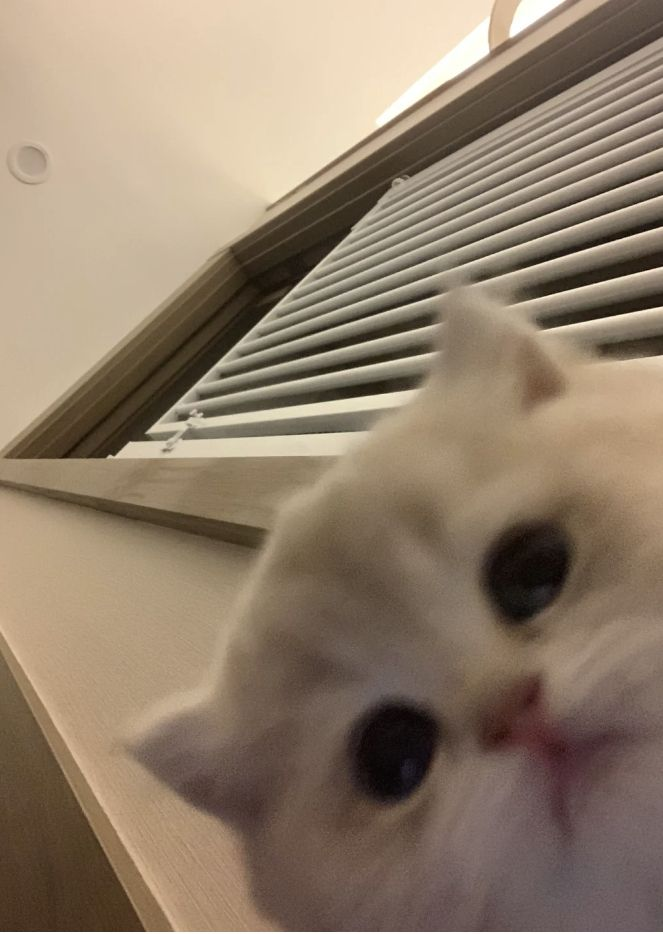
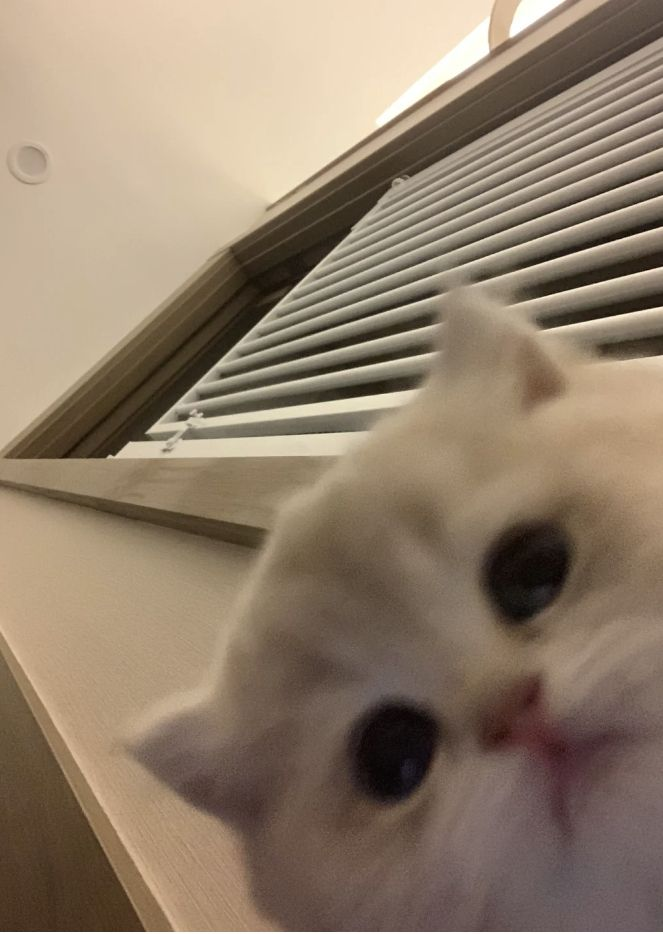

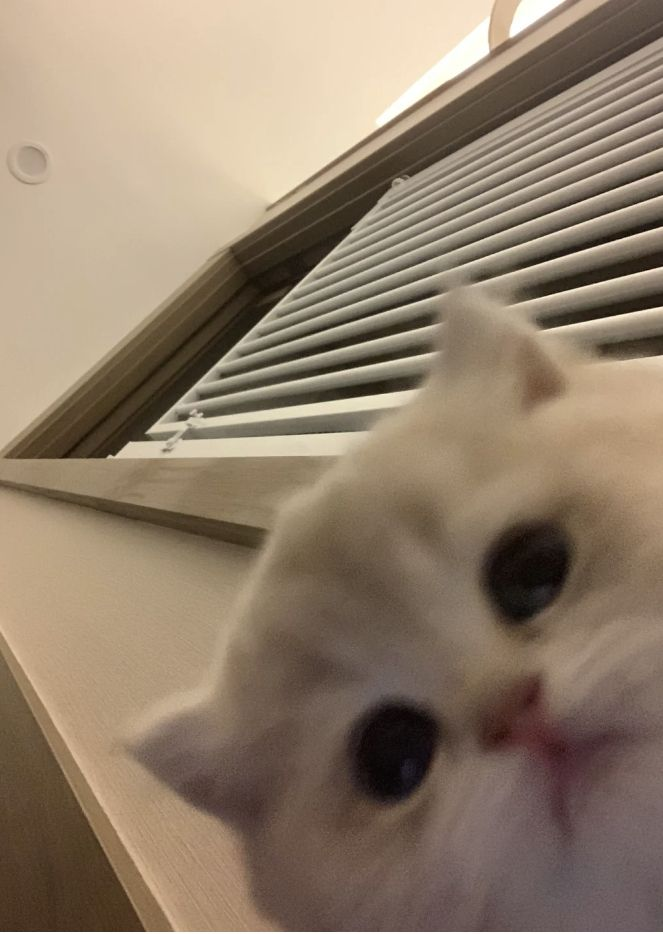
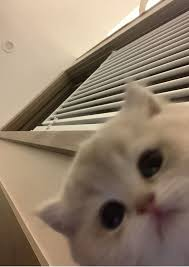
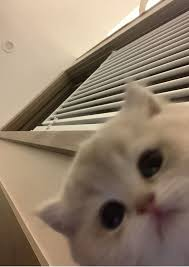
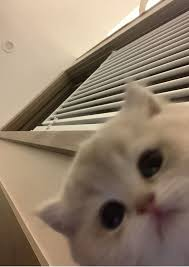
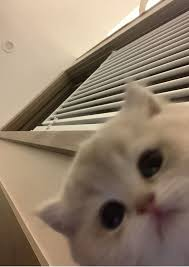
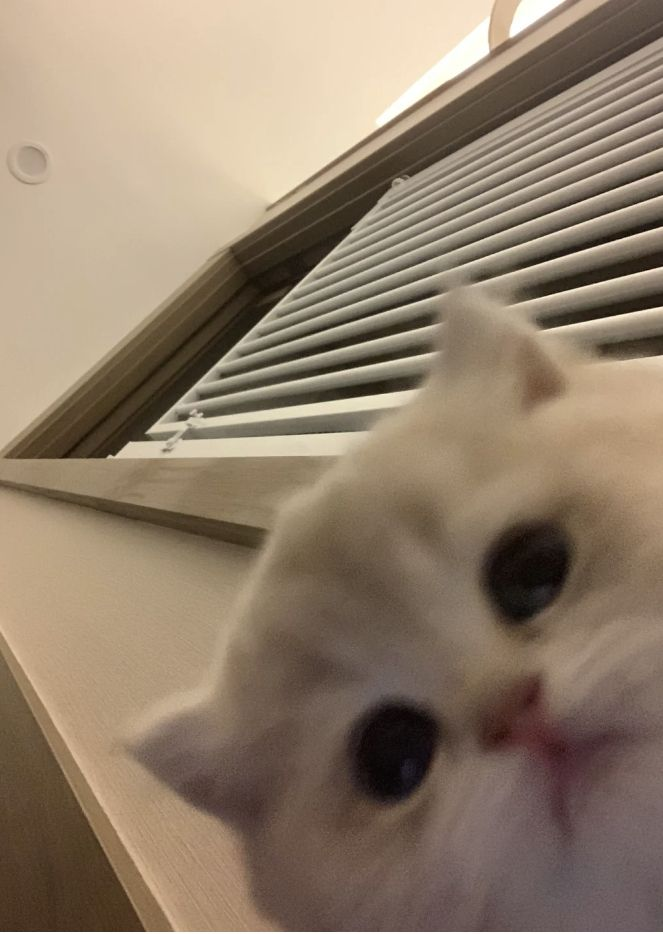
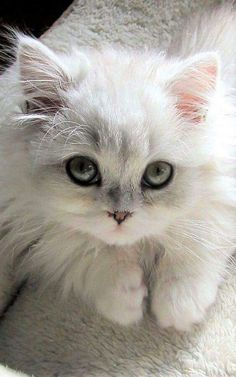
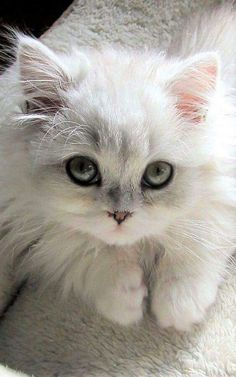